In [1]:
from time import time

In [2]:
import yt
import numpy as np
import yt.units as units
import pylab

In [3]:
# @yt.derived_field(name=('io',"posd_x"), units="code_length")
# def _posd_x(field, data):
#     return data[('PartType1','Coordinates')][:,0]

# @yt.derived_field(name=('io',"posd_y"), units="code_length")
# def _posd_y(field, data):
#     return data[('PartType1','Coordinates')][:,1]

# @yt.derived_field(name=('io',"posd_z"), units="code_length")
# def _posd_z(field, data):
#     return data[('PartType1','Coordinates')][:,2]

# # yt.add_field(("gas","pressure"), function=_posd_x, units="auto")

In [4]:
L=150
N=256
i=2
rund='r2'

In [5]:
# ds.fields

In [6]:
fname = f"/scratch/cprem/sims/L{L:d}_N{N:d}_Cp18_bar/{rund:s}/snaps/snapdir_{i:03d}/snapshot_{i:03d}.0.hdf5"

In [7]:
unit_base = {'UnitLength_in_cm'         : 3.08568e+24,
             'UnitMass_in_g'            :   1.989e+43,
             'UnitVelocity_in_cm_per_s' :      100000}

bbox_lim = L #Mpc

bbox = [[0,bbox_lim],
        [0,bbox_lim],
        [0,bbox_lim]]
 
ds = yt.load(fname, unit_base=unit_base)#, bounding_box=bbox)#, cosmology_parameters={})
ds.index

yt : [INFO     ] 2021-03-24 10:45:48,321 Calculating time from 2.355e-01 to be 6.234e+16 seconds
yt : [INFO     ] 2021-03-24 10:45:48,468 Parameters: current_time              = 6.2341375764091464e+16 s
yt : [INFO     ] 2021-03-24 10:45:48,470 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2021-03-24 10:45:48,471 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-03-24 10:45:48,471 Parameters: domain_right_edge         = [150. 150. 150.]
yt : [INFO     ] 2021-03-24 10:45:48,472 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-03-24 10:45:48,473 Parameters: current_redshift          = 3.2460085394425544
yt : [INFO     ] 2021-03-24 10:45:48,474 Parameters: omega_lambda              = 0.6936625
yt : [INFO     ] 2021-03-24 10:45:48,474 Parameters: omega_matter              = 0.3063375
yt : [INFO     ] 2021-03-24 10:45:48,475 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2021-03-24 10:45:48,476 Parameters: hubble_constant

In [8]:
ad= ds.all_data()

In [9]:
ds.fields

In [10]:
ds.index

In [10]:
# ad[('index','cell_volume')]

In [11]:
# ad[('PartType0', 'Density')]

In [12]:
# tmpar= Out[20]

In [13]:
# tmpar.sum(axis=0)

In [14]:
# ad[('all', 'Masses')]

In [15]:
# ad[('PartType1', 'Masses')]

In [12]:
# px = yt.ParticlePlot(ds, 'posd_x', 'posd_y', ('PartType1', 'Masses'))
# px.show()

In [13]:
# ad['posd_x']

In [14]:
# ad['posd_y'].shape[0], 256**3

In [27]:
# ds.derived_field_list[ds.quan(5.51575, 'Mpc'), ds.quan(9.82932, 'Mpc'), ds.quan(7.89961, 'Mpc')]

In [11]:
# ds.derived_field_listmy_sphere = ds.sphere([(5.51575, 'Mpc'), (9.82932, 'Mpc'), (7.89961, 'Mpc')], (2, "Mpc"))np.array([5.51575, 9.82932, 7.89961])*150/51.446514

In [24]:
ds.quan(5.51575, 'Mpc')

unyt_quantity(5, 'Mpc')

In [38]:
my_sphere = ds.sphere([ds.quan(5.51575, 'Mpc'), ds.quan(9.82932, 'Mpc'), ds.quan(7.89961, 'Mpc')], (40, "Mpc"))

In [42]:
px1 = yt.SlicePlot(ds, 'z', ('gas', 'density'), width=(10,10), center=[ds.quan(5.51575, 'Mpc'), ds.quan(9.82932, 'Mpc'), ds.quan(7.89961, 'Mpc')])

yt : [INFO     ] 2021-03-24 11:16:56,115 xlim = 3.779166 7.252334
yt : [INFO     ] 2021-03-24 11:16:56,116 ylim = 8.092736 11.565904
yt : [INFO     ] 2021-03-24 11:16:56,117 xlim = 10.881036 20.881036
yt : [INFO     ] 2021-03-24 11:16:56,118 ylim = 23.300737 33.300737
yt : [INFO     ] 2021-03-24 11:16:56,119 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



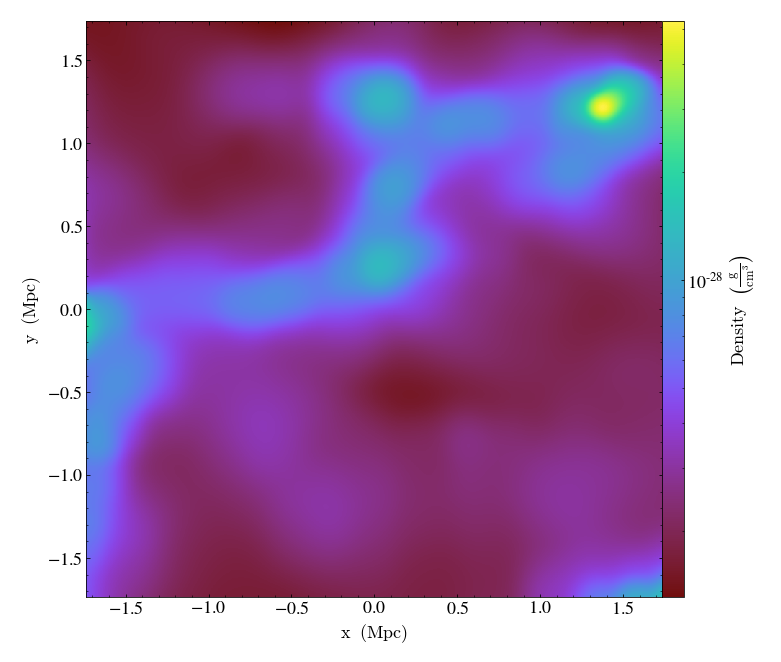

In [43]:
px1.show()


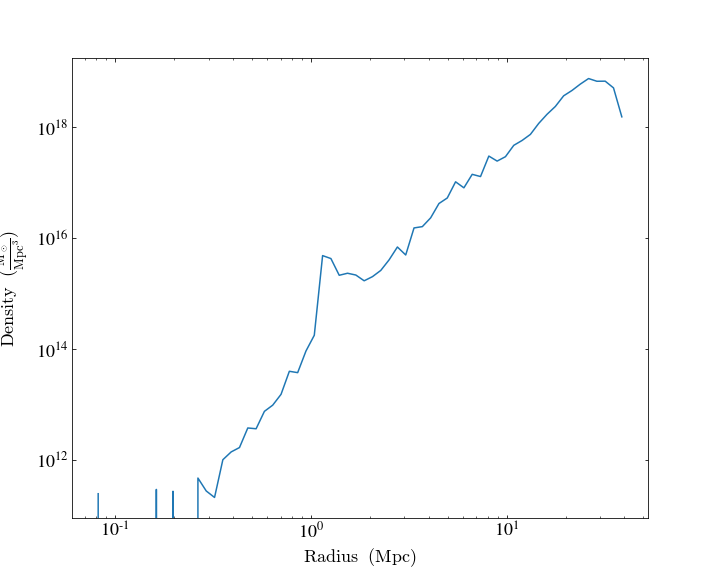

In [44]:
plot = yt.ProfilePlot(my_sphere, "radius", "density",
                      weight_field=None, accumulation=False)
plot.set_unit("density", "msun/Mpc**3")
plot.set_unit("radius", "Mpc")
plot.show()

In [17]:
t1 = time()

In [18]:
px1 = yt.SlicePlot(ds, 'z', ('deposit', 'PartType1_density'), origin='lower-left-domain', width=(150,150))#, center=(75,75,75))
# px1.show()

yt : [INFO     ] 2021-03-15 19:57:50,764 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-15 19:57:50,766 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-15 19:57:50,768 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-15 19:57:50,769 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-15 19:57:50,770 Making a fixed resolution buffer of (('deposit', 'PartType1_density')) 800 by 800


/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/site-packages/yt/visualization/base_plot_types.py:255: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  self.image = self.axes.imshow(
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_colle


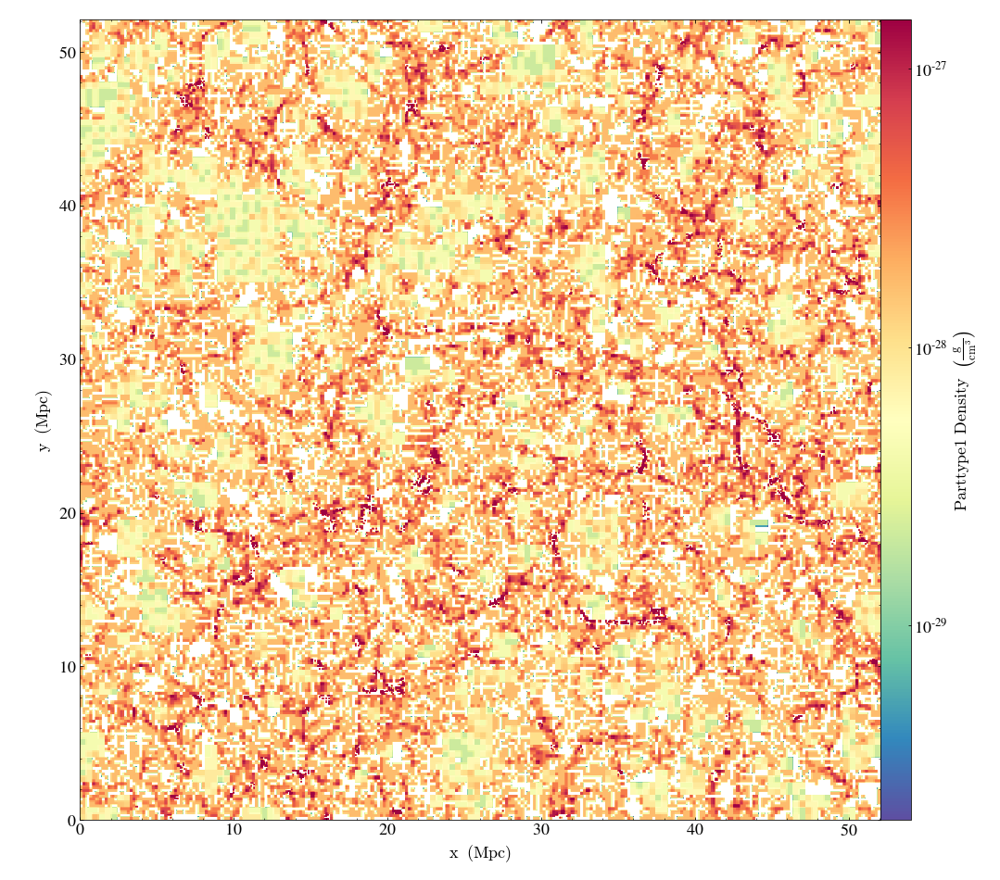

In [19]:
px1.set_figure_size(12)
px1.set_zlim('all', zmin=2e-30*1e0, zmax=1.5e-27*1e0)
px1.set_cmap('all', cmap='Spectral_r')

In [20]:
t2 = time()

In [21]:
t2-t1

9.22678518295288

In [19]:
from yt.visualization.volume_rendering.render_source import VolumeSource

In [22]:
from yt.visualization.volume_rendering.api import Scene, Camera, create_volume_source

In [23]:

# ds = yt.load('IsolatedGalaxy/galaxy0030/galaxy0030')
sc = Scene()


In [28]:
source = create_volume_source(ds.all_data(), ('deposit', 'PartType1_density'))

NotImplementedError: 

In [29]:
sc.add_source(source)
cam = sc.add_camera()
im = sc.render()

NameError: name 'source' is not defined

In [14]:
sc = yt.create_scene(ds, lens_type='perspective', )

# Get a reference to the VolumeSource associated with this scene
# It is the first source associated with the scene, so we can refer to it
# using index 0.
source = sc[0]

# Set the bounds of the transfer function
# source.tfh.set_bounds((3e-31, 5e-27))

# set that the transfer function should be evaluated in log space
# source.tfh.set_log(True)

# Make underdense regions appear opaque
# source.tfh.grey_opacity = True

# Plot the transfer function, along with the CDF of the density field to
# see how the transfer function corresponds to structure in the CDF
# source.tfh.plot('transfer_function.png', profile_field='density')

# save the image, flooring especially bright pixels for better contrast


NotImplementedError: 

In [13]:
sc.show()

yt : [INFO     ] 2021-03-21 03:42:43,416 Rendering scene (Can take a while).
yt : [INFO     ] 2021-03-21 03:42:43,423 Creating volume


RuntimeError: AMRKDTree does not support particle or octree-based data.

<Scene Object>:
Sources: 
    source_00: <Volume Source>:YTRegion (snapshot_002): , center=[8.0378064e+25 8.0378064e+25 8.0378064e+25] cm, left_edge=[0. 0. 0.] cm, right_edge=[1.60756128e+26 1.60756128e+26 1.60756128e+26] cm transfer_function:None
Camera: 
    <Camera Object>:
	position:[150. 150. 150.] code_length
	focus:[75. 75. 75.] code_length
	north_vector:[ 0.81649658 -0.40824829 -0.40824829]
	width:[225. 225. 225.] code_length
	light:None
	resolution:(512, 512)
Lens: <Lens Object>:
	lens_type:perspective
	viewpoint:[10.04809472 10.04809472 10.04809472] code_length

In [ ]:
sc.save('rendering.png', sigma_clip=6.0)

In [ ]:
yt.interactive_render(ds)

yt : [INFO     ] 2021-03-17 00:56:06,751 Setting default field to ('gas', 'density')


In [17]:
im, sc = yt.volume_render(ds, ('gas', 'density'), fname='rendering.png')

yt : [INFO     ] 2021-03-21 15:20:30,513 Rendering scene (Can take a while).
yt : [INFO     ] 2021-03-21 15:20:30,520 Creating volume


RuntimeError: AMRKDTree does not support particle or octree-based data.

In [14]:
ds.index.__class__

yt.geometry.particle_geometry_handler.ParticleIndex

In [21]:
px2 = yt.SlicePlot(ds, 'z', ('deposit', 'PartType1_cic'), origin='lower-left-domain', width=(150,150))#, center=(75,75,75))
# px2.show()

yt : [INFO     ] 2021-03-09 23:30:16,242 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:30:16,243 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:30:16,245 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:30:16,245 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:30:16,247 Making a fixed resolution buffer of (('deposit', 'PartType1_cic')) 800 by 800


/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/site-packages/yt/visualization/base_plot_types.py:255: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  self.image = self.axes.imshow(
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_colle


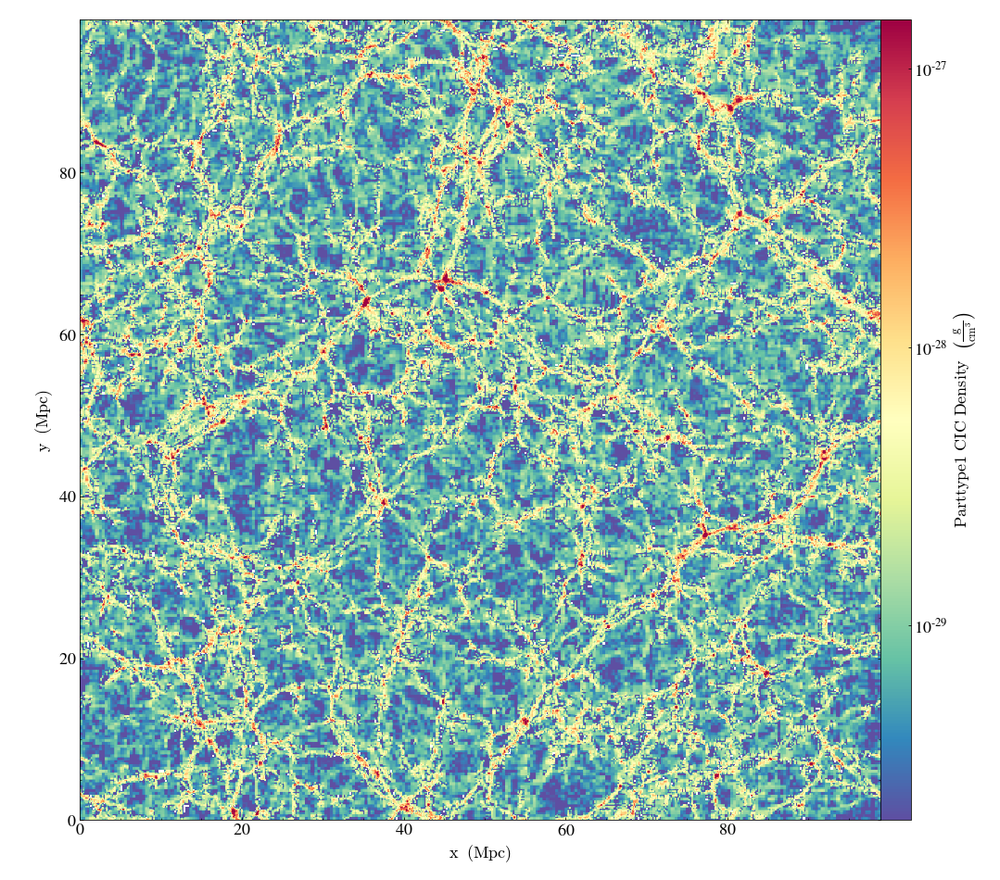

In [22]:
px2.set_figure_size(12)
px2.set_zlim('all', zmin=2e-30*1e0, zmax=1.5e-27*1e0)
px2.set_cmap('all', cmap='Spectral_r')

In [23]:
t3 = time()

In [24]:
px3 = yt.ProjectionPlot(ds, 'z', ('deposit', 'PartType1_density'), origin='lower-left-domain', width=(150,150))#, center=(75,75,75))
# px1.show()

yt : [INFO     ] 2021-03-09 23:33:11,697 Projection completed
yt : [INFO     ] 2021-03-09 23:33:11,701 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:33:11,701 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:33:11,703 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:33:11,704 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:33:11,705 Making a fixed resolution buffer of (('deposit', 'PartType1_density')) 800 by 800


/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/site-packages/yt/visualization/base_plot_types.py:255: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  self.image = self.axes.imshow(
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_colle


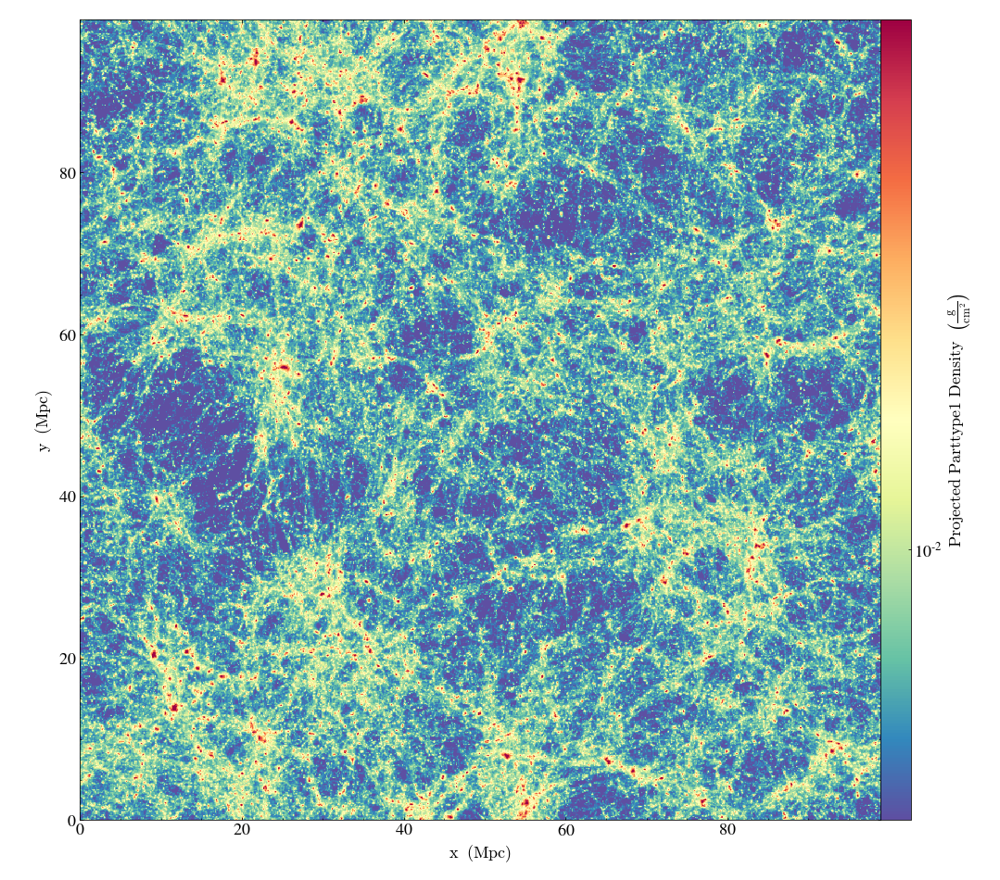

In [25]:
px3.set_figure_size(12)
px3.set_zlim('all', zmin=4e-3*1e0, zmax=6e-2*1e0)
# px3.set_colorbar_minorticks('all', True)
px3.set_cmap('all', cmap='Spectral_r')
px3.show()

In [26]:
t4 = time()

In [27]:
px4 = yt.ProjectionPlot(ds, 'z', ('deposit', 'PartType0_density'), origin='lower-left-domain', width=(150,150))#, center=(75,75,75))
# px4.show()

yt : [INFO     ] 2021-03-09 23:36:07,025 Projection completed
yt : [INFO     ] 2021-03-09 23:36:07,028 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:36:07,029 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:36:07,030 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:36:07,031 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 23:36:07,032 Making a fixed resolution buffer of (('deposit', 'PartType0_density')) 800 by 800


/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/site-packages/yt/visualization/base_plot_types.py:255: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  self.image = self.axes.imshow(
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_colle


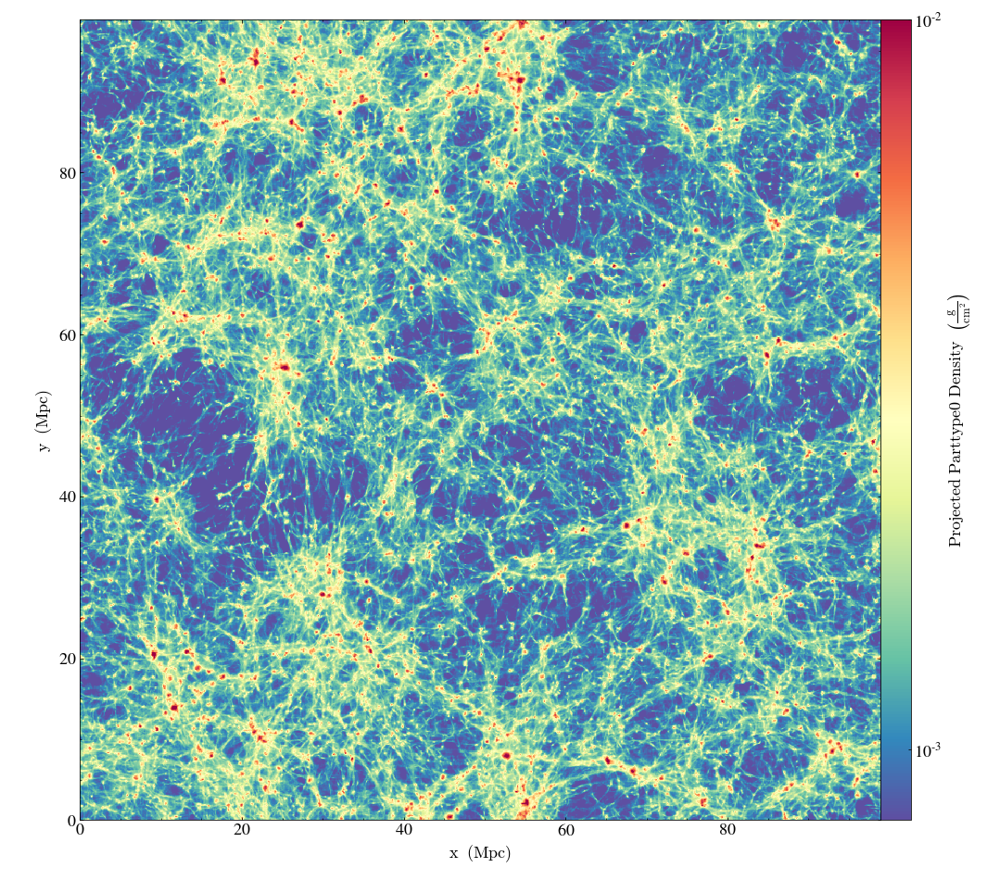

In [28]:
px4.set_figure_size(12)
px4.set_zlim('all', zmin=8e-4*1e0, zmax=10e-3*1e0)
px4.set_cmap('all', cmap='Spectral_r')
px4.show()

In [33]:
t5 = time()

In [34]:
px5 = yt.ProjectionPlot(ds, 'z', ('gas', 'density'), origin='lower-left-domain', width=(150,150))
# px5.show()

yt : [INFO     ] 2021-03-10 00:44:50,296 Projection completed
yt : [INFO     ] 2021-03-10 00:44:50,492 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-10 00:44:50,501 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-10 00:44:50,502 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-10 00:44:50,503 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-10 00:44:50,528 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800


/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/site-packages/yt/visualization/base_plot_types.py:255: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  self.image = self.axes.imshow(
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_colle


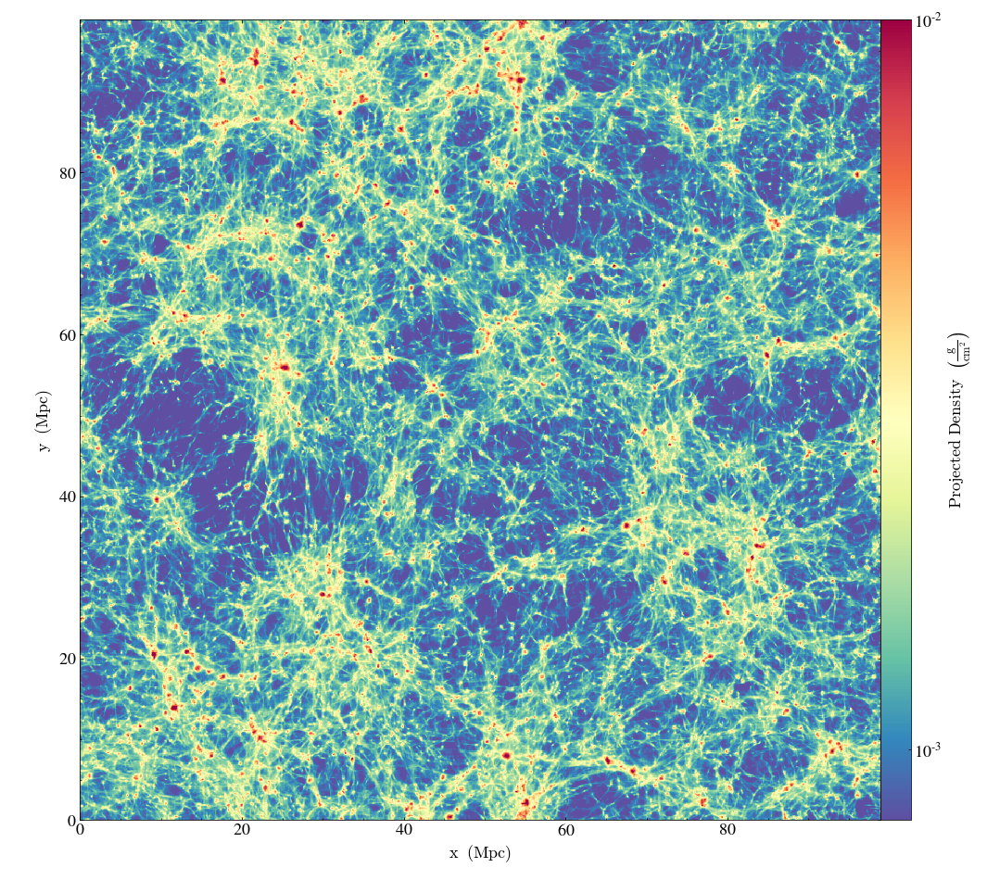

In [35]:
px5.set_figure_size(12)
px5.set_zlim('all', zmin=8e-4*1e0, zmax=10e-3*1e0)
px5.set_cmap('all', cmap='Spectral_r')
px5.show()

In [36]:
t6 = time()

In [37]:
print(t2-t1, t3-t2, t4-t3, t5-t4, t6-t5)

47.99122452735901 45.634132862091064 175.64051604270935 980.7992074489594 3318.8179149627686


/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/site-packages/yt/visualization/base_plot_types.py:255: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  self.image = self.axes.imshow(
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_colle


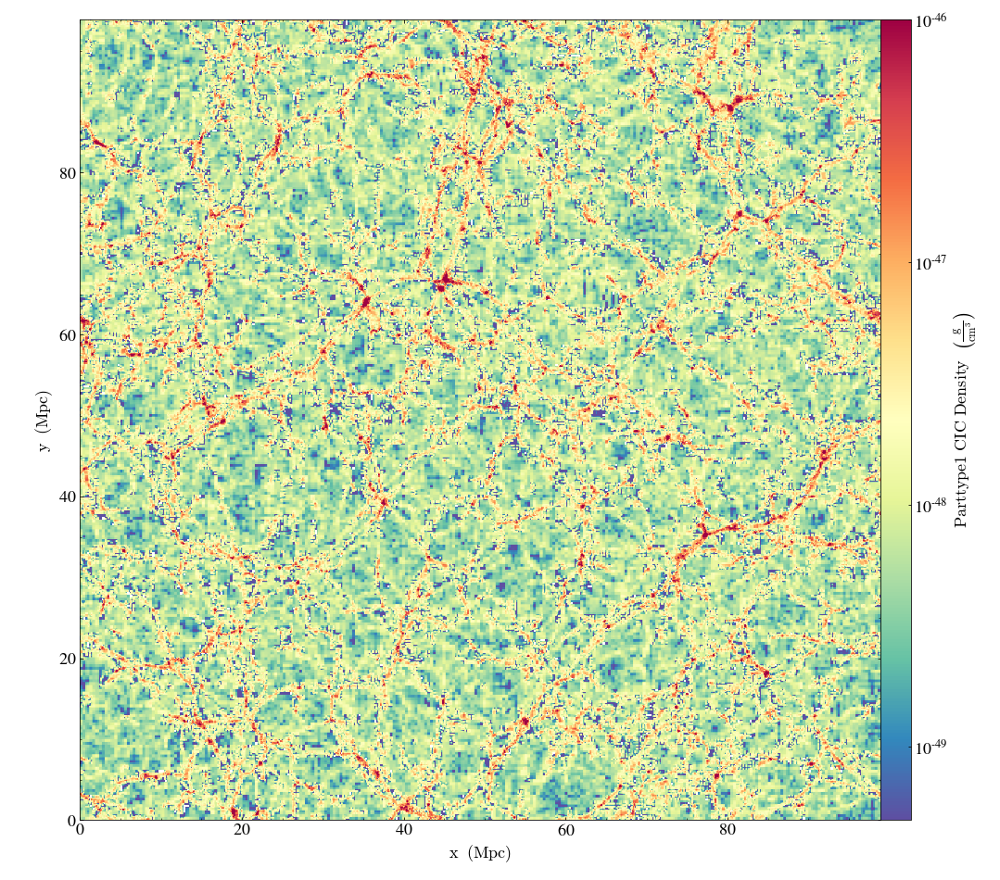

In [42]:
px5.set_figure_size(12)
px5.set_zlim('all', zmin=5e-50, zmax=1e-46)
px5.set_cmap('all', cmap='Spectral_r')

In [56]:
# px5.show()

yt : [INFO     ] 2021-03-09 20:53:06,428 Projection completed
yt : [INFO     ] 2021-03-09 20:53:06,432 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 20:53:06,433 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 20:53:06,435 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 20:53:06,436 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 20:53:06,438 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = oth


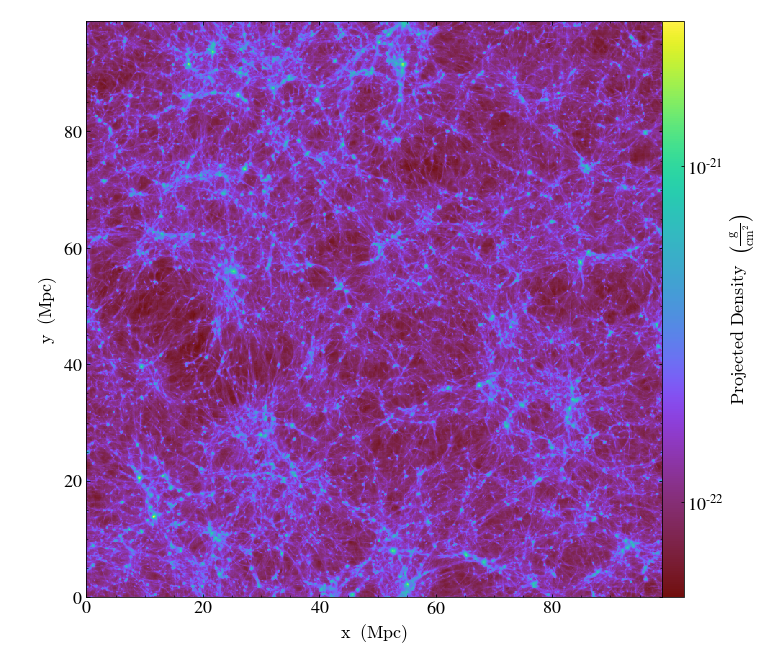

In [20]:
px3 = yt.ProjectionPlot(ds, 'z', ('gas', 'density'), origin='lower-left-domain', width=(150,150))
px3.show()

yt : [INFO     ] 2021-03-09 02:03:30,173 Projection completed
yt : [INFO     ] 2021-03-09 02:03:30,176 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 02:03:30,177 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 02:03:30,179 xlim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 02:03:30,179 ylim = 0.000000 150.000000
yt : [INFO     ] 2021-03-09 02:03:30,181 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/mnt/home/student/cprem/anaconda3/envs/conforg/lib/python3.9/_collections_abc.py:940: MatplotlibDeprecationWarning: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
  self[key] = oth


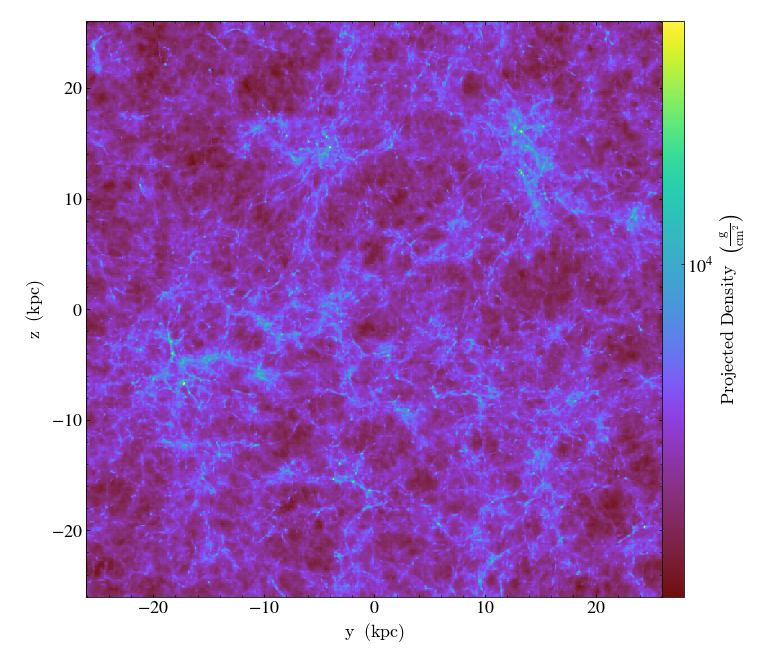

In [65]:
px = yt.ProjectionPlot(ds, 'x', ('gas', 'density'))
px.show()